In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
from matplotlib.pyplot import rc_context
import os
import seaborn as sns
import importlib
import re

In [2]:
import degSummary
from scanpyColor import godsnot_102

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, facecolor='white', dpi_save=600)

scanpy==1.8.2 anndata==0.7.5 umap==0.5.3 numpy==1.23.5 scipy==1.10.0 pandas==1.5.3 scikit-learn==1.2.0 statsmodels==0.13.5 python-igraph==0.10.3 louvain==0.8.0 pynndescent==0.5.8


# Load data

In [4]:
os.chdir('../..')

In [5]:
pwd

'/data/tcl/Project/ADFCA'

In [6]:
age_L=['10', '20', '30']
ageColor_L=['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']
ageColor_L2=['#009ACD', '#FF7D40', '#2CA02C', '#D62728']
ggplotColor3_L= ["#F8766D", "#00BA38", "#619CFF"]
set2Color_L=["#66C2A5", "#E9936A", "#A89BB0"]

In [7]:
genotype_L=['control', 'AB42', 'hTau']

In [8]:
figureFolder = 'Analysis/Figure'
os.makedirs(figureFolder, exist_ok=True)

In [9]:
figureDataFolder=f'Analysis/Figure'
os.makedirs(figureDataFolder, exist_ok=True)
figure1Folder=f'{figureDataFolder}/Figure1'
os.makedirs(figure1Folder, exist_ok=True)
figure1PicFolder=f'{figure1Folder}/pic'
os.makedirs(figure1PicFolder, exist_ok=True)


figure2Folder=f'{figureDataFolder}/Figure2'
os.makedirs(figure2Folder, exist_ok=True)
figure2PicFolder=f'{figure2Folder}/pic'
os.makedirs(figure2PicFolder, exist_ok=True)

In [10]:
cellnFolder=f'{figure2Folder}/cellN'
os.makedirs(cellnFolder, exist_ok=True)

compositionFolder=f'{figure2Folder}/composition'
os.makedirs(compositionFolder, exist_ok=True)

In [11]:
annotFolder='Analysis/5.ADFCA_AFCA_transfer_cellbender_scDblFinder'

In [12]:
genoAge_L = ['control_10', 'control_20', 'control_30', 'AB42_10', 'AB42_20', 'hTau_20', 'hTau_30']

In [13]:
genoAgeSex_L = ['control_10_female', 'control_20_female', 'control_30_female', 'control_10_male', 'control_20_male', 'control_30_male', 
                'AB42_10_female', 'AB42_20_female', 'AB42_10_male', 'AB42_20_male', 
                'hTau_20_female', 'hTau_30_female', 'hTau_20_male', 'hTau_30_male']

In [14]:
# ageCompare
genoCompare_Df = pd.DataFrame(columns=['expSet', 'controlSet', 'age'])
# genoCompare_Df['expSet'] = [exp for exp in genoAge_L if 'control' not in exp]
# genoCompare_Df['controlSet'] = pd.Categorical(['control_' + '_'.join(genoAge.split('_')[1:]) for genoAge in genoCompare_Df['expSet']])


genoCompare_Df.loc[0,:] = ['AB42', 'control_inAB42', '10,20']
genoCompare_Df.loc[1,:] = ['hTau', 'control_inTau', '20,30']
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


# Fig 2A Broad cell types of head cells

## Load files

In [20]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')

In [22]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv')
broadColor2_Df = pd.read_csv(f'{figure1Folder}/broadColor2_Df.csv')

In [24]:
broadColor1_D = dict(zip(broadColor1_Df.iloc[:,0], broadColor1_Df.iloc[:,1]))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

## Colored by adfca_annotation_broad

In [27]:
adata_head.obs.adfca_annotation_broad.cat.categories

Index(['CNS neuron', 'epithelial cell', 'fat cell', 'glial cell', 'hemocyte',
       'muscle cell', 'sensory neuron', 'tracheal cell', 'unannotated'],
      dtype='object')

In [28]:
adata_head

AnnData object with n_obs × n_vars = 360036 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'adfca_annotation_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'
    obsp: 'connectivities', 'distances'

In [30]:
adata_head.uns['adfca_annotation_broad_colors'] = [broadColor1_D[broad] for broad in adata_head.obs.adfca_annotation_broad.cat.categories]

In [31]:
figU, ax = plt.subplots(figsize=(6, 6))
sc.pl.tsne(adata_head, color=['adfca_annotation_broad'], frameon=False, 
           na_in_legend=False, show=False, size=1, ax= ax, title=f'head') # size=2, 
plt.savefig(f'{figure2PicFolder}/tsne_adfca_head_adfca_annotation_broad.pdf', bbox_inches='tight')
plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


# Fig 2B Cell composition (compare to control)

## Load files

In [22]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [23]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Summarize cell# (Separated by genotype)

In [24]:
# ageCompare
genoCompare_Df = pd.DataFrame(columns=['expSet', 'controlSet', 'age'])
# genoCompare_Df['expSet'] = [exp for exp in genoAge_L if 'control' not in exp]
# genoCompare_Df['controlSet'] = pd.Categorical(['control_' + '_'.join(genoAge.split('_')[1:]) for genoAge in genoCompare_Df['expSet']])


genoCompare_Df.loc[0,:] = ['AB42', 'control_inAB42', '10,20']
genoCompare_Df.loc[1,:] = ['hTau', 'control_inTau', '20,30']
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


In [25]:
celltypeGeno_Df=adata_headBody.obs.groupby(by=['adfca_annotation', 'genotype']).agg({'sex': 'count'})
celltypeGeno_Df

sex
adfca_annotation                                   genotype      
16-cell germline cyst in germarium region 2a an... control   1040
                                                   AB42       992
                                                   hTau       548
ABeta42-specific cluster                           control    644
                                                   AB42      2739
...                                                           ...
visceral muscle of the midgut                      AB42       186
                                                   hTau       225
young germ cell                                    control     18
                                                   AB42         1
                                                   hTau         3

[549 rows x 1 columns]

In [26]:
celltypeN_Df=pd.DataFrame(columns=['annotation', 'cellN' ]+['cellN_' + genotype for genotype in genotype_L ])

In [27]:
celltypeN_Df=pd.DataFrame(columns=['annotation', 'cellN' ]+['cellN_' + genotype for genotype in genotype_L ])
for celltype in sorted( set(celltypeGeno_Df.index.get_level_values('adfca_annotation')) ):
    # print(celltype)
    
    celltypeCount_Df=celltypeGeno_Df.loc[celltype]
    cellN=celltypeCount_Df.sex.sum()
    # print(cellN)
    
    lowNumAge='N'

    if lowNumAge == 'N':
        celltypeN_Df.loc[celltype]=[celltype, cellN] + celltypeCount_Df.sex.to_list()
    # print()

In [28]:
celltypeN_Df

,annotation,cellN,cellN_control,cellN_AB42,cellN_hTau
16-cell germline cyst in germarium region 2a and 2b,16-cell germline cyst in germarium region 2a a...,2580,1040,992,548
ABeta42-specific cluster,ABeta42-specific cluster,3765,644,2739,382
CNS surface associated glial cell,CNS surface associated glial cell,69,26,8,35
Poxn neuron,Poxn neuron,681,317,124,240
T neuron T2,T neuron T2,1368,618,337,413
...,...,...,...,...,...
uncharacterized CNS neuron,uncharacterized CNS neuron,90979,41995,20548,28436
uncharacterized glial cell,uncharacterized glial cell,444,134,126,184
visceral muscle of the crop,visceral muscle of the crop,331,83,64,184
visceral muscle of the midgut,visceral muscle of the midgut,652,241,186,225


In [29]:
celltypeN700_Df = celltypeN_Df[ (celltypeN_Df.cellN >= 700) & (~celltypeN_Df.annotation.isin(['unannotated', 'uncharacterized CNS neuron'])) ]

In [30]:
celltypeN700_Df

,annotation,cellN,cellN_control,cellN_AB42,cellN_hTau
16-cell germline cyst in germarium region 2a and 2b,16-cell germline cyst in germarium region 2a a...,2580,1040,992,548
ABeta42-specific cluster,ABeta42-specific cluster,3765,644,2739,382
T neuron T2,T neuron T2,1368,618,337,413
T neuron T2a,T neuron T2a,2048,860,608,580
T neuron T3,T neuron T3,1616,708,507,401
...,...,...,...,...,...
transmedullary neuron Tm2,transmedullary neuron Tm2,1858,820,483,555
transmedullary neuron Tm20,transmedullary neuron Tm20,1046,463,313,270
transmedullary neuron Tm3a,transmedullary neuron Tm3a,2238,1050,498,690
transmedullary neuron Tm4,transmedullary neuron Tm4,1308,550,361,397


In [31]:
# at lease 100*7 cells # 7 exp sets
celltypeN_Df.to_csv(f'{cellnFolder}/celltype_cellN.csv', index=False)
celltypeN700_Df.to_csv(f'{cellnFolder}/celltype_cellN_n700.csv', index=False)

In [32]:
genoCompare_Df.to_csv(f'{cellnFolder}/genoCompare_Df.csv', index=False)
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


---

In [33]:
celltypeN_Df=pd.read_csv(f'{cellnFolder}/celltype_cellN.csv')
celltypeN700_Df=pd.read_csv(f'{cellnFolder}/celltype_cellN_n700.csv')
celltypeN700_L = pd.read_csv(f'{cellnFolder}/celltype_cellN_n700.csv').annotation.to_list()
len(celltypeN700_L)

102

## Grouped by adfca_annotation

### cellN grouped by adfca_annotation

In [34]:
celltypeN700_L = pd.read_csv(f'{cellnFolder}/celltype_cellN_n700.csv').annotation.to_list()

In [35]:
adfcaTissue='head'

In [36]:
annotationDf=pd.DataFrame(adata_head.obs['adfca_annotation'].value_counts())
annotationDf.columns = ['TotalCellN']

for genoAge in genoAge_L:
    # print(genoAge)
    annotationDf[f'{genoAge}_CellN'] = adata_head[adata_head.obs.genoAge == genoAge].obs['adfca_annotation'].value_counts()

annotationDf.fillna(0, inplace=True)
annotationDf

,TotalCellN,control_10_CellN,control_20_CellN,control_30_CellN,AB42_10_CellN,AB42_20_CellN,hTau_20_CellN,hTau_30_CellN
uncharacterized CNS neuron,90979,13540,15102,13353,11023,9525,15912,12524
unannotated,28928,5212,4731,2984,4659,4114,4124,3104
outer photoreceptor cell,26996,3879,5563,3864,3225,3111,3341,4013
cone cell,24409,3206,4572,3421,2844,3013,4431,2922
epithelial cell_head,21390,3208,3142,2696,3076,2879,3504,2885
...,...,...,...,...,...,...,...,...
proximal medullary amacrine neuron Pm3*,182,30,25,30,16,19,35,27
distal medullary amacrine neuron Dm1,152,27,25,15,20,13,33,19
neuron 16,135,13,16,21,19,23,24,19
octopaminergic/tyraminergic neuron,112,20,13,11,17,8,21,22


In [37]:
annotationDf.to_csv(f'{cellnFolder}/{adfcaTissue}_cellN.csv',)

### Ratio (separated by genoAge)
Filter cell types with cellN <700

In [38]:
ratioDf=pd.DataFrame(index=annotationDf.index.to_list(), columns=[genoAge + '_ratio' for genoAge in genoAge_L])
for genoAge in genoAge_L:
    print(genoAge)
    ratioDf[f'{genoAge}_ratio'] = ( annotationDf[f'{genoAge}_CellN']/sum(annotationDf[f'{genoAge}_CellN']) )
ratioDf = ratioDf.sort_values(by=[f'{genoAge_L[0]}_ratio'])
ratioDf

control_10
control_20
control_30
AB42_10
AB42_20
hTau_20
hTau_30


,control_10_ratio,control_20_ratio,control_30_ratio,AB42_10_ratio,AB42_20_ratio,hTau_20_ratio,hTau_30_ratio
neuron 16,0.000232,0.000270,0.000449,0.000397,0.000512,0.000404,0.000414
proximal medullary amacrine neuron Pm1,0.000357,0.000641,0.000684,0.000501,0.000312,0.000640,0.000501
octopaminergic/tyraminergic neuron,0.000357,0.000219,0.000235,0.000355,0.000178,0.000354,0.000479
ABeta42-specific cluster,0.000411,0.002160,0.010543,0.020098,0.039553,0.001769,0.006032
crystal cell_head,0.000483,0.000186,0.000128,0.000397,0.000334,0.000101,0.000131
...,...,...,...,...,...,...,...
cone cell,0.057302,0.077166,0.073158,0.059417,0.067064,0.074640,0.063634
epithelial cell_head,0.057338,0.053030,0.057654,0.064264,0.064082,0.059025,0.062828
outer photoreceptor cell,0.069331,0.093892,0.082631,0.067377,0.069246,0.056279,0.087393
unannotated,0.093156,0.079849,0.063812,0.097336,0.091571,0.069469,0.067597


/tmp/ipykernel_1485879/1967564669.py:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


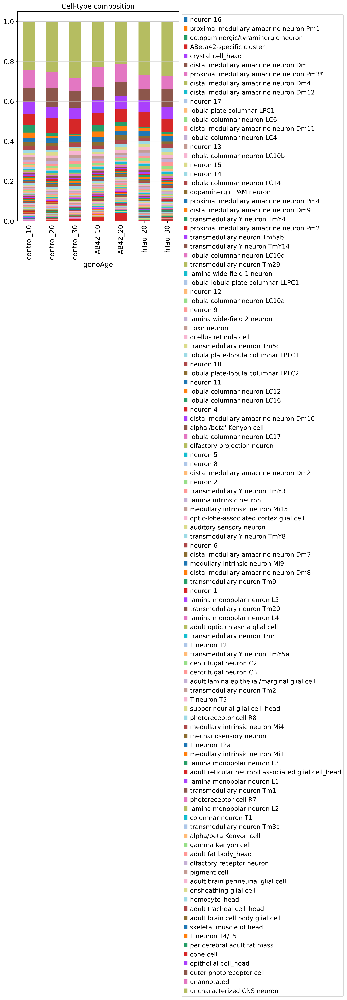

In [39]:
ratioDf=pd.DataFrame(index=annotationDf.index.to_list(), columns=[genoAge + '_ratio' for genoAge in genoAge_L])
for genoAge in genoAge_L:
    ratioDf[f'{genoAge}_ratio'] = ( annotationDf[f'{genoAge}_CellN']/sum(annotationDf[f'{genoAge}_CellN']) )
ratioDf = ratioDf.sort_values(by=[f'{genoAge_L[0]}_ratio'])

ratioT_Df=ratioDf.transpose()
ratioT_Df.insert(0, 'genoAge', genoAge_L)
ratioT_Df

with rc_context({'figure.figsize': (6, 8)}): 
    ax=ratioT_Df.plot(
        x = 'genoAge',
        kind = 'bar',
        stacked = True,
        title = 'Cell-type composition'
    )
    ax.grid(axis='x',visible=False)
    # plt.legend(loc='lower right')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_barplot_genoAge_cellRatio.pdf')
    plt.show()


### Ratio (separated by genotype)
Filter cell types with cellN <700

In [40]:
annotationDf=pd.read_csv(f'{cellnFolder}/{adfcaTissue}_cellN.csv', index_col=0)

In [41]:
annotationDf

,TotalCellN,control_10_CellN,control_20_CellN,control_30_CellN,AB42_10_CellN,AB42_20_CellN,hTau_20_CellN,hTau_30_CellN
uncharacterized CNS neuron,90979,13540,15102,13353,11023,9525,15912,12524
unannotated,28928,5212,4731,2984,4659,4114,4124,3104
outer photoreceptor cell,26996,3879,5563,3864,3225,3111,3341,4013
cone cell,24409,3206,4572,3421,2844,3013,4431,2922
epithelial cell_head,21390,3208,3142,2696,3076,2879,3504,2885
...,...,...,...,...,...,...,...,...
proximal medullary amacrine neuron Pm3*,182,30,25,30,16,19,35,27
distal medullary amacrine neuron Dm1,152,27,25,15,20,13,33,19
neuron 16,135,13,16,21,19,23,24,19
octopaminergic/tyraminergic neuron,112,20,13,11,17,8,21,22


In [42]:
annotationGeno_Df=annotationDf.iloc[:,:1]
annotationGeno_Df['control_inAB42'] = annotationDf['control_10_CellN'] + annotationDf['control_20_CellN']
annotationGeno_Df['AB42'] = annotationDf['AB42_10_CellN'] + annotationDf['AB42_20_CellN']
annotationGeno_Df['control_inTau'] = annotationDf['control_20_CellN'] + annotationDf['control_30_CellN']
annotationGeno_Df['hTau'] = annotationDf['hTau_20_CellN'] + annotationDf['hTau_30_CellN']

annotationGeno_Df

/tmp/ipykernel_1485879/769051514.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annotationGeno_Df['control_inAB42'] = annotationDf['control_10_CellN'] + annotationDf['control_20_CellN']
/tmp/ipykernel_1485879/769051514.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annotationGeno_Df['AB42'] = annotationDf['AB42_10_CellN'] + annotationDf['AB42_20_CellN']
/tmp/ipykernel_1485879/769051514.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

,TotalCellN,control_inAB42,AB42,control_inTau,hTau
uncharacterized CNS neuron,90979,28642,20548,28455,28436
unannotated,28928,9943,8773,7715,7228
outer photoreceptor cell,26996,9442,6336,9427,7354
cone cell,24409,7778,5857,7993,7353
epithelial cell_head,21390,6350,5955,5838,6389
...,...,...,...,...,...
proximal medullary amacrine neuron Pm3*,182,55,35,55,62
distal medullary amacrine neuron Dm1,152,52,33,40,52
neuron 16,135,29,42,37,43
octopaminergic/tyraminergic neuron,112,33,25,24,43


In [43]:
ratioDf=pd.DataFrame(index=annotationGeno_Df.index.to_list(), columns=[genotype + '_ratio' for genotype in annotationGeno_Df.columns[1:]])
for genotype in annotationGeno_Df.columns[1:]:
    print(genotype)
    ratioDf[f'{genotype}_ratio'] = ( annotationGeno_Df[f'{genotype}']/sum(annotationGeno_Df[f'{genotype}']) )
ratioDf = ratioDf.sort_values(by=[ f'{annotationGeno_Df.columns[1]}_ratio' ])
ratioDf

control_inAB42
AB42
control_inTau
hTau


,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio
neuron 16,0.000252,0.000453,0.000349,0.000408
octopaminergic/tyraminergic neuron,0.000286,0.000269,0.000226,0.000408
crystal cell_head,0.000330,0.000366,0.000160,0.000114
distal medullary amacrine neuron Dm1,0.000451,0.000356,0.000377,0.000494
proximal medullary amacrine neuron Pm3*,0.000477,0.000377,0.000519,0.000589
...,...,...,...,...
epithelial cell_head,0.055122,0.064176,0.055070,0.060683
cone cell,0.067519,0.063120,0.075398,0.069840
outer photoreceptor cell,0.081963,0.068282,0.088925,0.069849
unannotated,0.086312,0.094545,0.072775,0.068652


control_inAB42
AB42
control_inTau
hTau


/tmp/ipykernel_1485879/3879570179.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


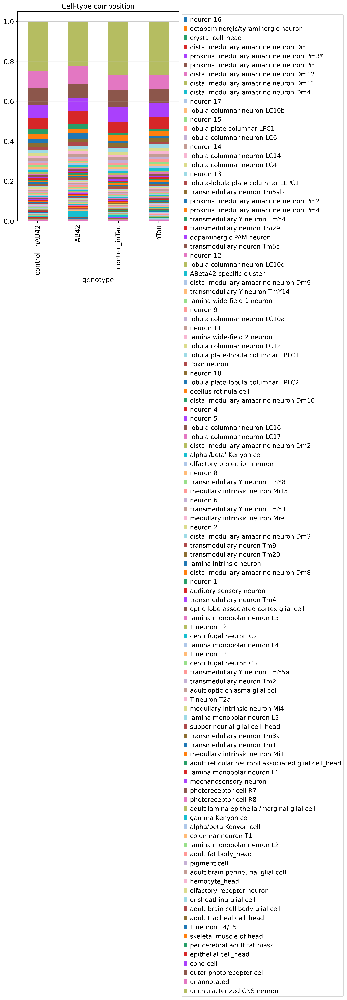

In [44]:
ratioDf=pd.DataFrame(index=annotationGeno_Df.index.to_list(), columns=[genotype + '_ratio' for genotype in annotationGeno_Df.columns[1:]])
for genotype in annotationGeno_Df.columns[1:]:
    print(genotype)
    ratioDf[f'{genotype}_ratio'] = ( annotationGeno_Df[f'{genotype}']/sum(annotationGeno_Df[f'{genotype}']) )
ratioDf = ratioDf.sort_values(by=[ f'{annotationGeno_Df.columns[1]}_ratio' ])
ratioDf

ratioT_Df=ratioDf.transpose()
# ratioT_Df.insert(0, 'genoAge', genoAge_L)
ratioT_Df.insert(0, 'genotype', annotationGeno_Df.columns[1:].to_list())
ratioT_Df

with rc_context({'figure.figsize': (6, 8)}): 
    ax=ratioT_Df.plot(
        x = 'genotype',
        kind = 'bar',
        stacked = True,
        title = 'Cell-type composition'
    )
    ax.grid(axis='x',visible=False)
    # plt.legend(loc='lower right')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_barplot_genotypeGroup_cellRatio.pdf')
    # plt.show()


### Relative ratio (normalize to control, separated by genotype group)
Filter cell types with cellN <700

In [45]:
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


In [46]:
genoCompare_D = dict(zip(genoCompare_Df.expSet, genoCompare_Df.controlSet))
genoCompare_D

{'AB42': 'control_inAB42', 'hTau': 'control_inTau'}

In [47]:
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio
neuron 16,0.000252,0.000453,0.000349,0.000408
octopaminergic/tyraminergic neuron,0.000286,0.000269,0.000226,0.000408
crystal cell_head,0.000330,0.000366,0.000160,0.000114
distal medullary amacrine neuron Dm1,0.000451,0.000356,0.000377,0.000494
proximal medullary amacrine neuron Pm3*,0.000477,0.000377,0.000519,0.000589
...,...,...,...,...
epithelial cell_head,0.055122,0.064176,0.055070,0.060683
cone cell,0.067519,0.063120,0.075398,0.069840
outer photoreceptor cell,0.081963,0.068282,0.088925,0.069849
unannotated,0.086312,0.094545,0.072775,0.068652


In [48]:
normalRatio_Df=ratioDf[:]
normalRatio_Df=normalRatio_Df.drop(['unannotated', 'uncharacterized CNS neuron'], axis=0)
normalRatio_Df=normalRatio_Df[normalRatio_Df.index.isin(celltypeN700_L)]

    
for expSet in genoCompare_Df.expSet:
    controlSet = genoCompare_D[expSet]
    print(expSet, controlSet)
    normalRatio_Df[f'{expSet}/{controlSet}_ratio']=normalRatio_Df[f'{expSet}_ratio']/normalRatio_Df[f'{controlSet}_ratio']

normalRatio_Df=normalRatio_Df.iloc[:,4:]
normalRatioNoLog2_Df=normalRatio_Df[:]
normalRatio_Df=np.log2(normalRatio_Df)

normalRatioNoLog2_Df=normalRatioNoLog2_Df.sort_values(by=f'{genoCompare_Df.iloc[0,0]}/{genoCompare_Df.iloc[0,1]}_ratio', ascending=False)
normalRatio_Df=normalRatio_Df.sort_values(by=f'{genoCompare_Df.iloc[0,0]}/{genoCompare_Df.iloc[0,1]}_ratio', ascending=False)

normalRatio_Df.replace([np.inf, -np.inf], np.nan, inplace=True)
normalRatioNoLog2_Df.replace([np.inf, -np.inf], np.nan, inplace=True)

normalRatio_Df

AB42 control_inAB42
hTau control_inTau


,AB42/control_inAB42_ratio,hTau/control_inTau_ratio
ABeta42-specific cluster,4.493072,-0.691093
T neuron T4/T5,0.543295,0.406150
alpha'/beta' Kenyon cell,0.490500,0.557416
neuron 6,0.447875,0.282007
distal medullary amacrine neuron Dm2,0.435779,0.410751
...,...,...
olfactory receptor neuron,-0.457384,-0.016244
auditory sensory neuron,-0.483339,0.321684
lamina monopolar neuron L2,-0.509909,0.051670
medullary intrinsic neuron Mi1,-0.582860,0.078362


In [49]:
normalRatio_Df.insert(0, 'annotation', normalRatio_Df.index.to_list())
normalRatio_longDf=normalRatio_Df.melt(id_vars=['annotation'], var_name='genotypeCompare', value_name='log2ratio')
normalRatio_longDf

,annotation,genotypeCompare,log2ratio
0,ABeta42-specific cluster,AB42/control_inAB42_ratio,4.493072
1,T neuron T4/T5,AB42/control_inAB42_ratio,0.543295
2,alpha'/beta' Kenyon cell,AB42/control_inAB42_ratio,0.490500
3,neuron 6,AB42/control_inAB42_ratio,0.447875
4,distal medullary amacrine neuron Dm2,AB42/control_inAB42_ratio,0.435779
...,...,...,...
129,olfactory receptor neuron,hTau/control_inTau_ratio,-0.016244
130,auditory sensory neuron,hTau/control_inTau_ratio,0.321684
131,lamina monopolar neuron L2,hTau/control_inTau_ratio,0.051670
132,medullary intrinsic neuron Mi1,hTau/control_inTau_ratio,0.078362


In [51]:
dfAll=normalRatio_Df[:]
for expSet in genoCompare_Df.expSet:
    controlSet = genoCompare_D[expSet]
    print(expSet, controlSet)
    
    # annotationGeno_Df[expSet]+annotationGeno_Df[controlSet]
    # annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][controlSet]
    
    dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][controlSet]

AB42 control_inAB42
hTau control_inTau


/tmp/ipykernel_1485879/3904034619.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][controlSet]
/tmp/ipykernel_1485879/3904034619.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll[f'{expSet}/{controlSet}_CellN'] = annotationGeno_Df[annotationGeno_Df.index.isin(celltypeN700_L)][expSet]+annotationGeno_Df[annotationGeno_Df.inde

In [52]:
dfAll

,annotation,AB42/control_inAB42_ratio,hTau/control_inTau_ratio,AB42/control_inAB42_CellN,hTau/control_inTau_CellN
ABeta42-specific cluster,ABeta42-specific cluster,4.493072,-0.691093,2890,1003
T neuron T4/T5,T neuron T4/T5,0.543295,0.406150,4739,2279
alpha'/beta' Kenyon cell,alpha'/beta' Kenyon cell,0.490500,0.557416,599,832
neuron 6,neuron 6,0.447875,0.282007,659,351
distal medullary amacrine neuron Dm2,distal medullary amacrine neuron Dm2,0.435779,0.410751,560,355
...,...,...,...,...,...
olfactory receptor neuron,olfactory receptor neuron,-0.457384,-0.016244,2591,3528
auditory sensory neuron,auditory sensory neuron,-0.483339,0.321684,662,957
lamina monopolar neuron L2,lamina monopolar neuron L2,-0.509909,0.051670,1633,2143
medullary intrinsic neuron Mi1,medullary intrinsic neuron Mi1,-0.582860,0.078362,1221,1729


In [53]:
dfAll.sort_values(by=['AB42/control_inAB42_ratio'], inplace=True) # ascending=False, 

/tmp/ipykernel_1485879/1320765540.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll.sort_values(by=['AB42/control_inAB42_ratio'], inplace=True) # ascending=False,


In [54]:
dotplot_Df=dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[1:3]), 
                      var_name='genotypeCompare', value_name='log2ratio')
# dotplot_Df

dotplot_Df=pd.concat([dotplot_Df, 
           dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[3:]), 
                      var_name='genotypeCompare', value_name='cellN').iloc[:,2] ], 
          axis=1) # 

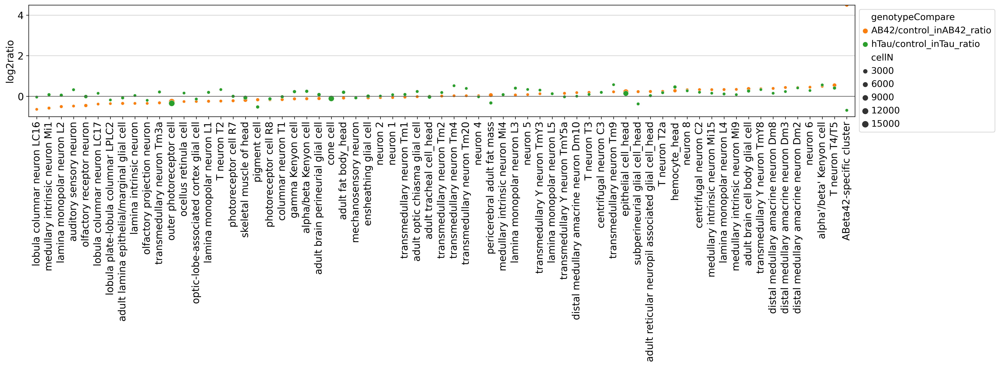

In [55]:
with rc_context({'figure.figsize': (20, 7.5)}):
    ax=sns.scatterplot(data=dotplot_Df, 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[1:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-1, 4.5)
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom.pdf')
    plt.show()

# for x in os.listdir('figures/'): 
#     os.replace(f'figures/{x}', f'{figure3PicFolder}/{x}')

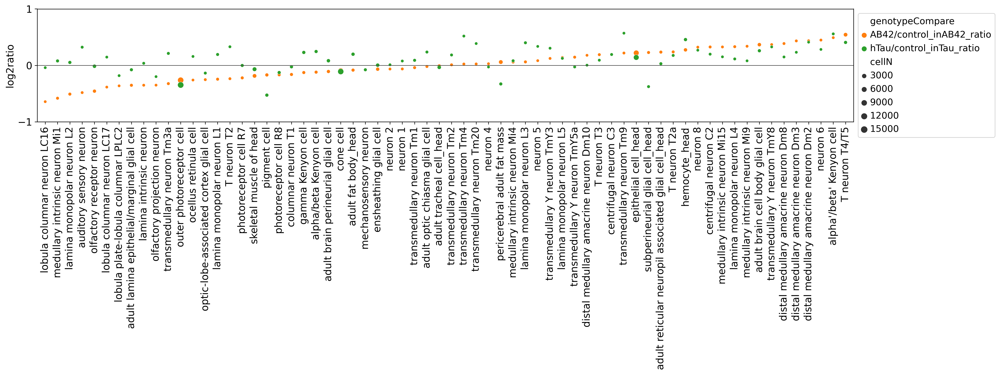

In [56]:
### remove ABeta42-specific cluster

with rc_context({'figure.figsize': (20, 7.5)}):
    ax=sns.scatterplot(data=dotplot_Df[dotplot_Df.annotation != 'ABeta42-specific cluster'], 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[1:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-1, 1)
    plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noABcluster.pdf')
    plt.show()

# for x in os.listdir('figures/'): 
#     os.replace(f'figures/{x}', f'{figure3PicFolder}/{x}')

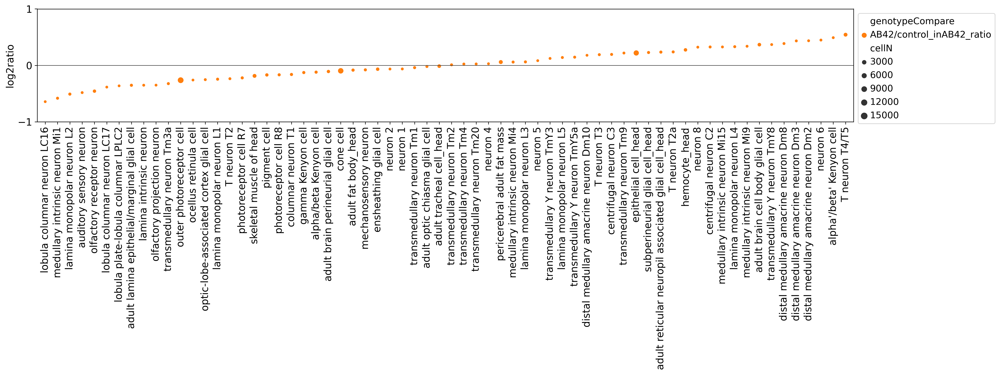

In [57]:
### remove ABeta42-specific cluster
### No Tau

with rc_context({'figure.figsize': (20, 7.5)}):
    ax=sns.scatterplot(data=dotplot_Df[(dotplot_Df.annotation != 'ABeta42-specific cluster') & (dotplot_Df.genotypeCompare != 'hTau/control_inTau_ratio')], 
                       x="annotation", y="log2ratio", size='cellN', hue="genotypeCompare", palette=sns.color_palette("tab10")[1:2]) # palette=set2Color_L # palette='Set2',  # hue="genotypeCompare", # palette=sns.color_palette("tab10")[1:2]
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-1, 1)
    plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_noTau.pdf')
    plt.show()

# for x in os.listdir('figures/'): 
#     os.replace(f'figures/{x}', f'{figure3PicFolder}/{x}')

Sort data by hTau/control ratio

In [58]:
dfAll.sort_values(by=['hTau/control_inTau_ratio'], inplace=True) # ascending=False, 

/tmp/ipykernel_1485879/878428539.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfAll.sort_values(by=['hTau/control_inTau_ratio'], inplace=True) # ascending=False,


In [59]:
dotplot_Df=dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[1:3]), 
                      var_name='genotypeCompare', value_name='log2ratio')
# dotplot_Df

dotplot_Df=pd.concat([dotplot_Df, 
           dfAll.melt(id_vars=['annotation'], value_vars=list(dfAll.columns[3:]), 
                      var_name='genotypeCompare', value_name='cellN').iloc[:,2] ], 
          axis=1) # 

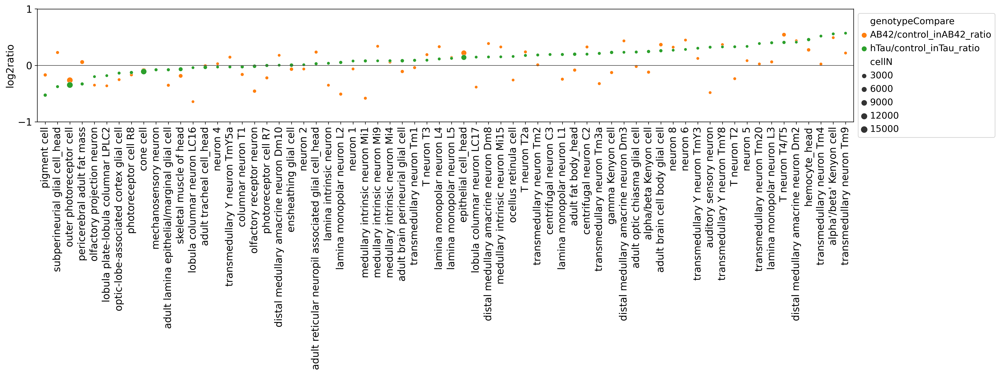

In [60]:
### remove ABeta42-specific cluster

with rc_context({'figure.figsize': (20, 7.5)}):
    ax=sns.scatterplot(data=dotplot_Df[dotplot_Df.annotation != 'ABeta42-specific cluster'], 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[1:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-1, 1)
    plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_sortedByTau.pdf')
    plt.show()

# for x in os.listdir('figures/'): 
#     os.replace(f'figures/{x}', f'{figure3PicFolder}/{x}')

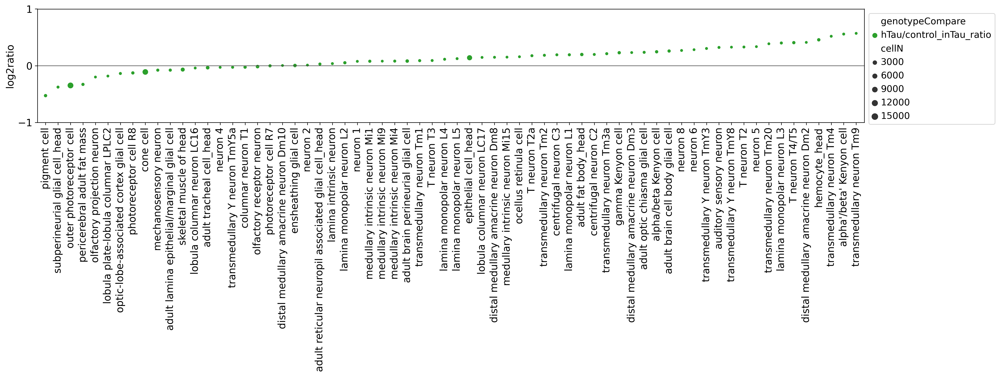

In [61]:
### remove ABeta42-specific cluster
### No AB42

with rc_context({'figure.figsize': (20, 7.5)}):
    ax=sns.scatterplot(data=dotplot_Df[(dotplot_Df.annotation != 'ABeta42-specific cluster') & (dotplot_Df.genotypeCompare == 'hTau/control_inTau_ratio')], 
                       x="annotation", y="log2ratio", hue="genotypeCompare", size='cellN', palette=sns.color_palette("tab10")[2:3]) # palette=set2Color_L # palette='Set2', 
    ax.grid(axis='x',visible=False)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.axhline(0, color='black', linewidth=0.5)
    # plt.tight_layout(w_pad=0.5)
    plt.subplots_adjust(bottom=0.6)
    plt.tight_layout()
    ax.margins(0.01, 0.03)
    plt.ylim(-1, 1)
    plt.yticks([-1, 0, 1])
    plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_dotplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_noAB42.pdf')
    plt.show()

# for x in os.listdir('figures/'): 
#     os.replace(f'figures/{x}', f'{figure3PicFolder}/{x}')

### Output cell# and ratios

In [62]:
annotationDf.to_csv(f'{cellnFolder}/{adfcaTissue}_cellN_genotypeGroup.csv')

In [63]:
dfAll.to_csv(f'{cellnFolder}/{adfcaTissue}_dfAll_genotypeGroup.csv')
ratioDf.to_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_genotypeGroup.csv')
dotplot_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_dotplot_Df_genotypeGroup.csv')

In [64]:
normalRatio_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatioDf_normalizeToControl_genotypeGroup.csv')
normalRatioNoLog2_Df.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatioNoLog2_Df_normalizeToControl_genotypeGroup.csv')
normalRatio_longDf.to_csv(f'{cellnFolder}/{adfcaTissue}_normalRatio_longDf_normalizeToControl_genotypeGroup.csv')

### Add adfca_annotation_broad

In [65]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [66]:
dfAll = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_dfAll_genotypeGroup.csv', index_col=0)
dotplot_Df = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_dotplot_Df_genotypeGroup.csv')

In [67]:
annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_annotation_detailed_and_broad_detailed.csv')
annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation
0,CNS neuron,ABeta42-specific cluster,ABeta42-specific cluster
1,CNS neuron,Poxn neuron,Poxn neuron
2,CNS neuron,T neuron,T neuron T2
3,CNS neuron,T neuron,T neuron T2a
4,CNS neuron,T neuron,T neuron T3
...,...,...,...
178,sensory neuron,sensory neuron,scolopidial neuron
179,tracheal cell,tracheal cell,adult tracheal cell_body
180,tracheal cell,tracheal cell,adult tracheal cell_head
181,unannotated,unannotated,antimicrobial peptide-producing cell


In [68]:
broad_L = ['CNS neuron', 'sensory neuron', 'glial cell', 'PNS neuron']
annot2broad_D = {annot: annotation_Df.adfca_annotation_broad[n] if annotation_Df.adfca_annotation_broad[n] in broad_L else 'others' for n, annot in enumerate(annotation_Df.adfca_annotation)}
# annot2broad_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_broad))

annot2group_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_group))

In [69]:
adfcaTissue='head'

In [70]:
ratioDf = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_ratioDf_genotypeGroup.csv', index_col=0)
ratioDf['adfca_annotation'] = list(ratioDf.index)
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio,adfca_annotation
neuron 16,0.000252,0.000453,0.000349,0.000408,neuron 16
octopaminergic/tyraminergic neuron,0.000286,0.000269,0.000226,0.000408,octopaminergic/tyraminergic neuron
crystal cell_head,0.000330,0.000366,0.000160,0.000114,crystal cell_head
distal medullary amacrine neuron Dm1,0.000451,0.000356,0.000377,0.000494,distal medullary amacrine neuron Dm1
proximal medullary amacrine neuron Pm3*,0.000477,0.000377,0.000519,0.000589,proximal medullary amacrine neuron Pm3*
...,...,...,...,...,...
epithelial cell_head,0.055122,0.064176,0.055070,0.060683,epithelial cell_head
cone cell,0.067519,0.063120,0.075398,0.069840,cone cell
outer photoreceptor cell,0.081963,0.068282,0.088925,0.069849,outer photoreceptor cell
unannotated,0.086312,0.094545,0.072775,0.068652,unannotated


In [71]:
ratioDf['adfca_annotation_broad'] = pd.Categorical([annot2broad_D[annot] for annot in ratioDf.index if annot ])
ratioDf

,control_inAB42_ratio,AB42_ratio,control_inTau_ratio,hTau_ratio,adfca_annotation,adfca_annotation_broad
neuron 16,0.000252,0.000453,0.000349,0.000408,neuron 16,CNS neuron
octopaminergic/tyraminergic neuron,0.000286,0.000269,0.000226,0.000408,octopaminergic/tyraminergic neuron,CNS neuron
crystal cell_head,0.000330,0.000366,0.000160,0.000114,crystal cell_head,others
distal medullary amacrine neuron Dm1,0.000451,0.000356,0.000377,0.000494,distal medullary amacrine neuron Dm1,CNS neuron
proximal medullary amacrine neuron Pm3*,0.000477,0.000377,0.000519,0.000589,proximal medullary amacrine neuron Pm3*,CNS neuron
...,...,...,...,...,...,...
epithelial cell_head,0.055122,0.064176,0.055070,0.060683,epithelial cell_head,others
cone cell,0.067519,0.063120,0.075398,0.069840,cone cell,sensory neuron
outer photoreceptor cell,0.081963,0.068282,0.088925,0.069849,outer photoreceptor cell,sensory neuron
unannotated,0.086312,0.094545,0.072775,0.068652,unannotated,others


In [72]:
dotplot_Df['adfca_annotation_broad'] = pd.Categorical([ annot2broad_D[annot] for annot in dotplot_Df.annotation ])
dotplot_Df

,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
0,0,ABeta42-specific cluster,AB42/control_inAB42_ratio,4.493072,2890,CNS neuron
1,1,pigment cell,AB42/control_inAB42_ratio,-0.170042,2368,glial cell
2,2,subperineurial glial cell_head,AB42/control_inAB42_ratio,0.227458,1399,glial cell
3,3,outer photoreceptor cell,AB42/control_inAB42_ratio,-0.263477,15778,sensory neuron
4,4,pericerebral adult fat mass,AB42/control_inAB42_ratio,0.058001,5352,others
...,...,...,...,...,...,...
129,129,distal medullary amacrine neuron Dm2,hTau/control_inTau_ratio,0.410751,355,CNS neuron
130,130,hemocyte_head,hTau/control_inTau_ratio,0.456434,2625,others
131,131,transmedullary neuron Tm4,hTau/control_inTau_ratio,0.518802,676,CNS neuron
132,132,alpha'/beta' Kenyon cell,hTau/control_inTau_ratio,0.557416,832,CNS neuron


In [73]:
# cmap=sns.color_palette("Set3", 8) # Pastel2
cmap=sns.color_palette("Set3", 9) # Pastel2
cmap

[(0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
 (1.0, 1.0, 0.7019607843137254),
 (0.7450980392156863, 0.7294117647058823, 0.8549019607843137),
 (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
 (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 (0.9921568627450981, 0.7058823529411765, 0.3843137254901961),
 (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
 (0.9882352941176471, 0.803921568627451, 0.8980392156862745),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [74]:
# value_to_int={'body':0, 'head': 1}
value_to_int = dict(zip(dotplot_Df.adfca_annotation_broad.value_counts().index.to_list(), range(8)))
# value_to_int.pop('unannotated')
# value_to_int
n = len(value_to_int) 

In [75]:
dotplot_Df_noAbeta = dotplot_Df[ (dotplot_Df.annotation != 'ABeta42-specific cluster') & (dotplot_Df.genotypeCompare == 'AB42/control_inAB42_ratio') ]
dotplot_Df_noAbeta.sort_values(by='log2ratio', inplace=True)
dotplot_Df_noAbeta

/tmp/ipykernel_1485879/2114704738.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dotplot_Df_noAbeta.sort_values(by='log2ratio', inplace=True)


,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
13,13,lobula columnar neuron LC16,AB42/control_inAB42_ratio,-0.643901,391,CNS neuron
27,27,medullary intrinsic neuron Mi1,AB42/control_inAB42_ratio,-0.582860,1221,CNS neuron
25,25,lamina monopolar neuron L2,AB42/control_inAB42_ratio,-0.509909,1633,CNS neuron
55,55,auditory sensory neuron,AB42/control_inAB42_ratio,-0.483339,662,sensory neuron
18,18,olfactory receptor neuron,AB42/control_inAB42_ratio,-0.457384,2591,sensory neuron
...,...,...,...,...,...,...
48,48,distal medullary amacrine neuron Dm3,AB42/control_inAB42_ratio,0.433152,739,CNS neuron
62,62,distal medullary amacrine neuron Dm2,AB42/control_inAB42_ratio,0.435779,560,CNS neuron
53,53,neuron 6,AB42/control_inAB42_ratio,0.447875,659,CNS neuron
65,65,alpha'/beta' Kenyon cell,AB42/control_inAB42_ratio,0.490500,599,CNS neuron


In [76]:
df=pd.DataFrame(index=dotplot_Df_noAbeta.annotation.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in dotplot_Df_noAbeta.adfca_annotation_broad]
df

,lobula columnar neuron LC16,medullary intrinsic neuron Mi1,lamina monopolar neuron L2,auditory sensory neuron,olfactory receptor neuron,lobula columnar neuron LC17,lobula plate-lobula columnar LPLC2,adult lamina epithelial/marginal glial cell,lamina intrinsic neuron,olfactory projection neuron,...,lamina monopolar neuron L4,medullary intrinsic neuron Mi9,adult brain cell body glial cell,transmedullary Y neuron TmY8,distal medullary amacrine neuron Dm8,distal medullary amacrine neuron Dm3,distal medullary amacrine neuron Dm2,neuron 6,alpha'/beta' Kenyon cell,T neuron T4/T5
value,0.0,0.0,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
value_to_int.keys()

dict_keys(['CNS neuron', 'glial cell', 'sensory neuron', 'others'])

In [78]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv', index_col=0)
broadColor1_D = dict(zip(broadColor1_Df.index, broadColor1_Df.colorKey))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

In [79]:
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df.adfca_annotation_broad.value_counts().index.to_list()]

/tmp/ipykernel_1485879/2696372622.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 3000x225 with 0 Axes>

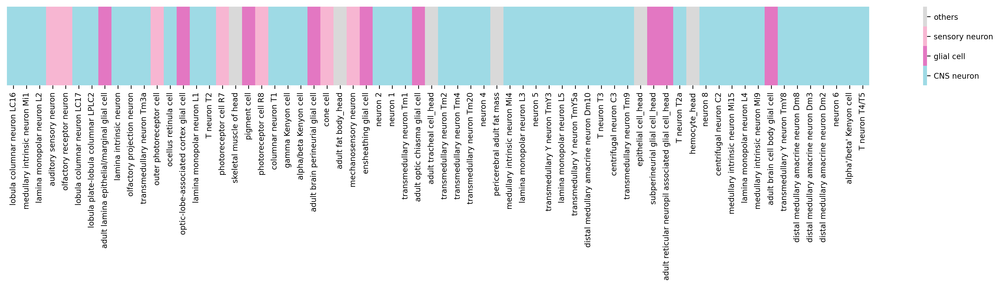

In [82]:
plt.figure(figsize=(20, 1.5))
fig, ax = plt.subplots(figsize=(20, 1.5))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_barplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_broadCellType.pdf', bbox_inches='tight')
plt.show()

**Sorted by hTau**

In [83]:
dotplot_Df_noAbeta = dotplot_Df[ (dotplot_Df.annotation != 'ABeta42-specific cluster') & (dotplot_Df.genotypeCompare != 'AB42/control_inAB42_ratio') ]
dotplot_Df_noAbeta.sort_values(by='log2ratio', inplace=True)
dotplot_Df_noAbeta

/tmp/ipykernel_1485879/3592416921.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dotplot_Df_noAbeta.sort_values(by='log2ratio', inplace=True)


,Unnamed: 0,annotation,genotypeCompare,log2ratio,cellN,adfca_annotation_broad
68,68,pigment cell,hTau/control_inTau_ratio,-0.527989,2420,glial cell
69,69,subperineurial glial cell_head,hTau/control_inTau_ratio,-0.377444,1124,glial cell
70,70,outer photoreceptor cell,hTau/control_inTau_ratio,-0.348342,16781,sensory neuron
71,71,pericerebral adult fat mass,hTau/control_inTau_ratio,-0.329776,1937,others
72,72,olfactory projection neuron,hTau/control_inTau_ratio,-0.200158,399,CNS neuron
...,...,...,...,...,...,...
129,129,distal medullary amacrine neuron Dm2,hTau/control_inTau_ratio,0.410751,355,CNS neuron
130,130,hemocyte_head,hTau/control_inTau_ratio,0.456434,2625,others
131,131,transmedullary neuron Tm4,hTau/control_inTau_ratio,0.518802,676,CNS neuron
132,132,alpha'/beta' Kenyon cell,hTau/control_inTau_ratio,0.557416,832,CNS neuron


In [84]:
df=pd.DataFrame(index=dotplot_Df_noAbeta.annotation.to_list()).T
df.loc['value',:] = [value_to_int[annot] for annot in dotplot_Df_noAbeta.adfca_annotation_broad]
df

,pigment cell,subperineurial glial cell_head,outer photoreceptor cell,pericerebral adult fat mass,olfactory projection neuron,lobula plate-lobula columnar LPLC2,optic-lobe-associated cortex glial cell,photoreceptor cell R8,cone cell,mechanosensory neuron,...,T neuron T2,neuron 5,transmedullary neuron Tm20,lamina monopolar neuron L3,T neuron T4/T5,distal medullary amacrine neuron Dm2,hemocyte_head,transmedullary neuron Tm4,alpha'/beta' Kenyon cell,transmedullary neuron Tm9
value,1.0,1.0,2.0,3.0,0.0,0.0,1.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0


In [85]:
cmap_L = [broadColor1_D[celltype] if celltype in broadColor1_D.keys() else cmap[-1] for celltype in dotplot_Df.adfca_annotation_broad.value_counts().index.to_list()]

/tmp/ipykernel_1485879/3164643611.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 3000x225 with 0 Axes>

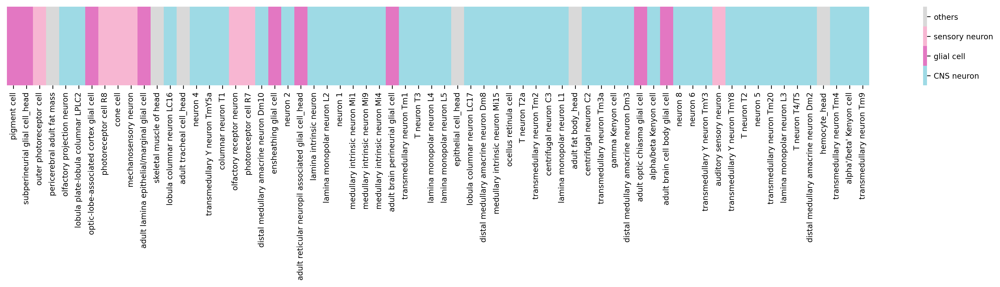

In [86]:
plt.figure(figsize=(20, 1.5))
fig, ax = plt.subplots(figsize=(20, 1.5))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, cmap= cmap_L, xticklabels=True, yticklabels=False) # cmap[:8]
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure2PicFolder}/{adfcaTissue}_barplot_cellRatio_normalizeToControl_genotypeCom_noABcluster_broadCellType_sortedByTau.pdf', bbox_inches='tight')
plt.show()

### Normalized ratios presented in the tsne

In [87]:
adfcaTissue = 'head'

In [88]:
annotationDf=pd.read_csv(f'{cellnFolder}/{adfcaTissue}_cellN_genotypeGroup.csv', index_col=0)
annotationDf

,TotalCellN,control_10_CellN,control_20_CellN,control_30_CellN,AB42_10_CellN,AB42_20_CellN,hTau_20_CellN,hTau_30_CellN
uncharacterized CNS neuron,90979,13540,15102,13353,11023,9525,15912,12524
unannotated,28928,5212,4731,2984,4659,4114,4124,3104
outer photoreceptor cell,26996,3879,5563,3864,3225,3111,3341,4013
cone cell,24409,3206,4572,3421,2844,3013,4431,2922
epithelial cell_head,21390,3208,3142,2696,3076,2879,3504,2885
...,...,...,...,...,...,...,...,...
proximal medullary amacrine neuron Pm3*,182,30,25,30,16,19,35,27
distal medullary amacrine neuron Dm1,152,27,25,15,20,13,33,19
neuron 16,135,13,16,21,19,23,24,19
octopaminergic/tyraminergic neuron,112,20,13,11,17,8,21,22


In [89]:
normalRatio_longDf = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_normalRatio_longDf_normalizeToControl_genotypeGroup.csv', index_col=0)
normalRatio_longDf

,annotation,genotypeCompare,log2ratio
0,ABeta42-specific cluster,AB42/control_inAB42_ratio,4.493072
1,T neuron T4/T5,AB42/control_inAB42_ratio,0.543295
2,alpha'/beta' Kenyon cell,AB42/control_inAB42_ratio,0.490500
3,neuron 6,AB42/control_inAB42_ratio,0.447875
4,distal medullary amacrine neuron Dm2,AB42/control_inAB42_ratio,0.435779
...,...,...,...
129,olfactory receptor neuron,hTau/control_inTau_ratio,-0.016244
130,auditory sensory neuron,hTau/control_inTau_ratio,0.321684
131,lamina monopolar neuron L2,hTau/control_inTau_ratio,0.051670
132,medullary intrinsic neuron Mi1,hTau/control_inTau_ratio,0.078362


In [90]:
normalRatio_Df = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_normalRatioDf_normalizeToControl_genotypeGroup.csv', index_col=0)
normalRatio_Df

,annotation,AB42/control_inAB42_ratio,hTau/control_inTau_ratio
ABeta42-specific cluster,ABeta42-specific cluster,4.493072,-0.691093
T neuron T4/T5,T neuron T4/T5,0.543295,0.406150
alpha'/beta' Kenyon cell,alpha'/beta' Kenyon cell,0.490500,0.557416
neuron 6,neuron 6,0.447875,0.282007
distal medullary amacrine neuron Dm2,distal medullary amacrine neuron Dm2,0.435779,0.410751
...,...,...,...
olfactory receptor neuron,olfactory receptor neuron,-0.457384,-0.016244
auditory sensory neuron,auditory sensory neuron,-0.483339,0.321684
lamina monopolar neuron L2,lamina monopolar neuron L2,-0.509909,0.051670
medullary intrinsic neuron Mi1,medullary intrinsic neuron Mi1,-0.582860,0.078362


In [91]:
ratioAB42_D = dict(zip(normalRatio_Df.index, normalRatio_Df['AB42/control_inAB42_ratio']))
ratioTau_D = dict(zip(normalRatio_Df.index, normalRatio_Df['hTau/control_inTau_ratio']))

In [92]:
adata_head.obs['nucleiRatio_AB42'] = [ ratioAB42_D[celltype] if celltype in ratioAB42_D.keys() else np.nan for n, celltype in enumerate(adata_head.obs.adfca_annotation)]
adata_head.obs['nucleiRatio_AB42_noABcluster'] = [  ratio if adata_head.obs['adfca_annotation'][n] != 'ABeta42-specific cluster' else np.nan for n, ratio in enumerate(adata_head.obs['nucleiRatio_AB42']) ]
adata_head.obs['nucleiRatio_Tau'] = [ ratioTau_D[celltype] if celltype in ratioTau_D.keys() else np.nan for n, celltype in enumerate(adata_head.obs.adfca_annotation)]

In [93]:
adata_head.obs['nucleiRatio_AB42_neg'] = [ -ratio if ratio <0 else np.nan for ratio in adata_head.obs['nucleiRatio_AB42']  ]
adata_head.obs['nucleiRatio_Tau_neg'] = [ -ratio if ratio <0 else np.nan for ratio in adata_head.obs['nucleiRatio_Tau']  ]

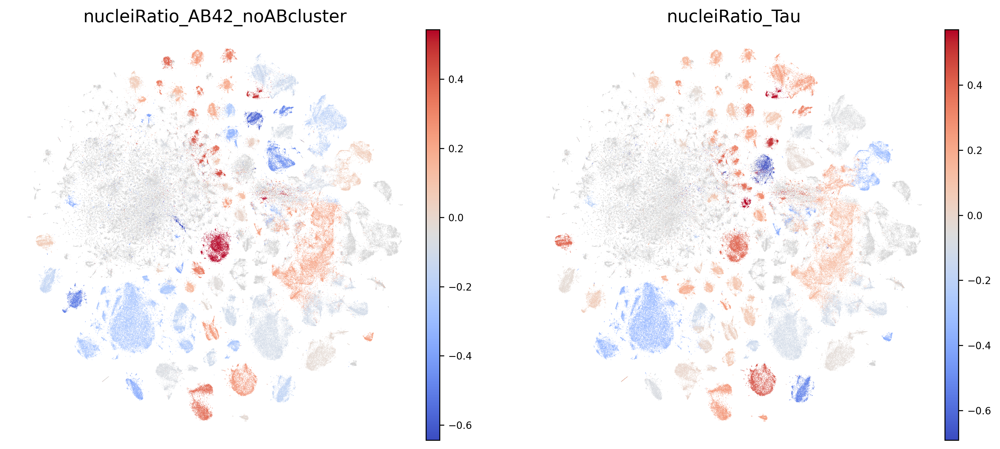

In [94]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.tsne(adata_head, color=['nucleiRatio_AB42_noABcluster', 'nucleiRatio_Tau'], cmap='coolwarm', frameon=False,
               save=f'_nucleiRatio_allClusters.pdf')

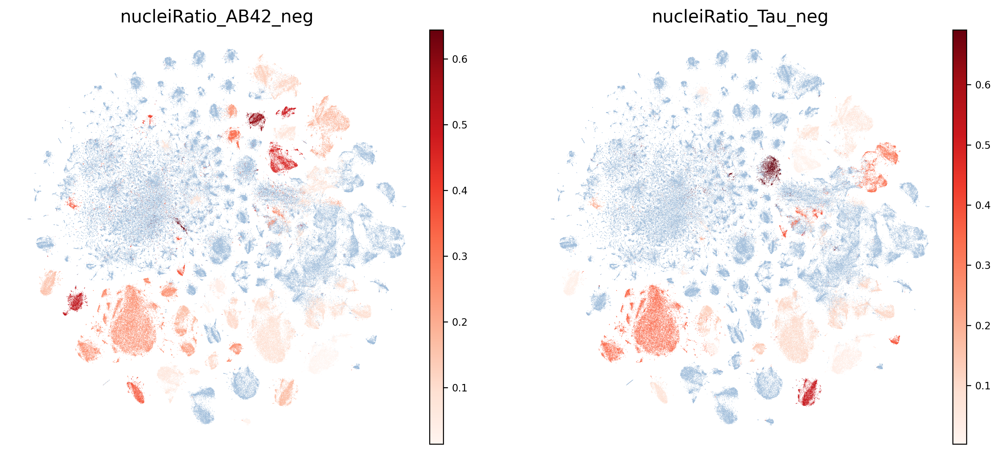

In [95]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.tsne(adata_head, color=['nucleiRatio_AB42_neg', 'nucleiRatio_Tau_neg'], cmap='Reds', frameon=False, na_color='#9ebcda',
               save=f'_nucleiRatio_onlyDecrease_Blues.pdf')

In [96]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure2PicFolder}/{x}')

### Bar plot of normalized ratios (bottom 10)

In [97]:
annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_annotation_detailed_and_broad_detailed.csv')
annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation
0,CNS neuron,ABeta42-specific cluster,ABeta42-specific cluster
1,CNS neuron,Poxn neuron,Poxn neuron
2,CNS neuron,T neuron,T neuron T2
3,CNS neuron,T neuron,T neuron T2a
4,CNS neuron,T neuron,T neuron T3
...,...,...,...
178,sensory neuron,sensory neuron,scolopidial neuron
179,tracheal cell,tracheal cell,adult tracheal cell_body
180,tracheal cell,tracheal cell,adult tracheal cell_head
181,unannotated,unannotated,antimicrobial peptide-producing cell


In [98]:
broad_L = ['CNS neuron', 'sensory neuron', 'glial cell', 'PNS neuron']
annot2broad_D = {annot: annotation_Df.adfca_annotation_broad[n] if annotation_Df.adfca_annotation_broad[n] in broad_L else 'others' for n, annot in enumerate(annotation_Df.adfca_annotation)}
# annot2broad_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_broad))

annot2group_D = dict(zip(annotation_Df.adfca_annotation, annotation_Df.adfca_annotation_group))

In [99]:
broadColor1_Df = pd.read_csv(f'{figure1Folder}/broadColor1_Df.csv', index_col=0)
broadColor1_D = dict(zip(broadColor1_Df.index, broadColor1_Df.colorKey))
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

### ABeta ratio

In [100]:
adfcaTissue = 'head'
normalRatio_longDf = pd.read_csv(f'{cellnFolder}/{adfcaTissue}_normalRatio_longDf_normalizeToControl_genotypeGroup.csv', index_col=0)
normalRatio_longDf.sort_values(by='log2ratio', inplace=True)
normalRatio_longDf_ab = normalRatio_longDf[normalRatio_longDf.genotypeCompare == 'AB42/control_inAB42_ratio'].iloc[:10,:]
normalRatio_longDf_ab['ratio'] = [ 2 ** (log2ratio) for log2ratio in normalRatio_longDf_ab.log2ratio]
normalRatio_longDf_ab['annotationWithN'] = pd.Categorical([ f'{n+1}. {annot}' for n, annot in enumerate(normalRatio_longDf_ab.annotation)])
normalRatio_longDf_ab.reset_index(inplace=True)
normalRatio_longDf_ab

,index,annotation,genotypeCompare,log2ratio,ratio,annotationWithN
0,66,lobula columnar neuron LC16,AB42/control_inAB42_ratio,-0.643901,0.639980,1. lobula columnar neuron LC16
1,65,medullary intrinsic neuron Mi1,AB42/control_inAB42_ratio,-0.582860,0.667639,2. medullary intrinsic neuron Mi1
2,64,lamina monopolar neuron L2,AB42/control_inAB42_ratio,-0.509909,0.702267,3. lamina monopolar neuron L2
3,63,auditory sensory neuron,AB42/control_inAB42_ratio,-0.483339,0.715320,4. auditory sensory neuron
4,62,olfactory receptor neuron,AB42/control_inAB42_ratio,-0.457384,0.728306,5. olfactory receptor neuron
5,61,lobula columnar neuron LC17,AB42/control_inAB42_ratio,-0.385687,0.765414,6. lobula columnar neuron LC17
6,60,lobula plate-lobula columnar LPLC2,AB42/control_inAB42_ratio,-0.363334,0.777366,7. lobula plate-lobula columnar LPLC2
7,59,adult lamina epithelial/marginal glial cell,AB42/control_inAB42_ratio,-0.353112,0.782894,8. adult lamina epithelial/marginal glial cell
8,58,lamina intrinsic neuron,AB42/control_inAB42_ratio,-0.352146,0.783418,9. lamina intrinsic neuron
9,57,olfactory projection neuron,AB42/control_inAB42_ratio,-0.350922,0.784083,10. olfactory projection neuron


In [101]:
normalRatio_longDf_ab['annotation_broad'] = pd.Categorical( [ annot2broad_D[annot] for annot in normalRatio_longDf_ab.annotation] )

normalRatio_longDf_ab.annotationWithN = pd.Categorical(normalRatio_longDf_ab.annotationWithN.to_list(), categories=normalRatio_longDf_ab.annotationWithN.to_list())
normalRatio_longDf_ab.annotationWithN.cat.categories

Index(['1. lobula columnar neuron LC16', '2. medullary intrinsic neuron Mi1',
       '3. lamina monopolar neuron L2', '4. auditory sensory neuron',
       '5. olfactory receptor neuron', '6. lobula columnar neuron LC17',
       '7. lobula plate-lobula columnar LPLC2',
       '8. adult lamina epithelial/marginal glial cell',
       '9. lamina intrinsic neuron', '10. olfactory projection neuron'],
      dtype='object')

In [103]:
normalRatio_longDf_ab['function'] = pd.Categorical(['vision', 'vision', 'vision', 'auditory', 'olfactory',
                                                    'vision', 'vision', 'vision', 'vision', 'olfactory'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


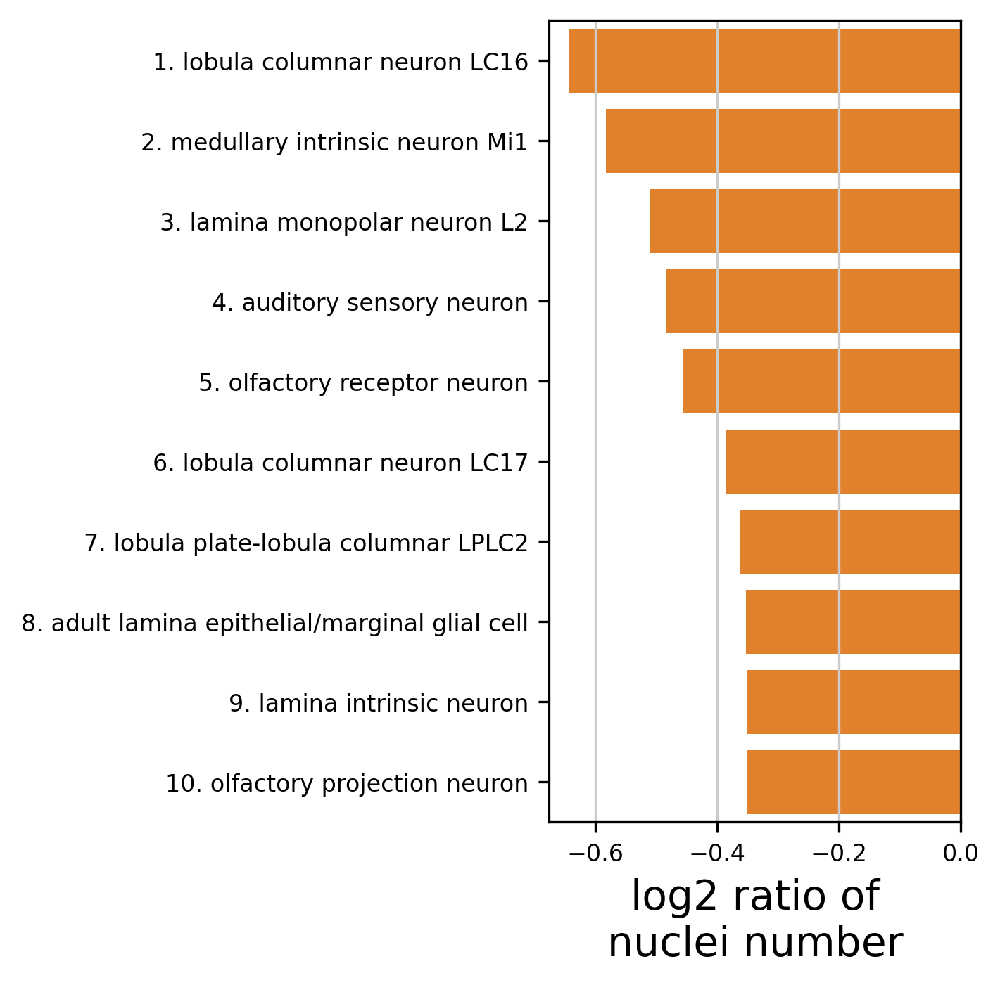

In [104]:
fig, ax = plt.subplots(figsize=(2.5, 5))
sns.barplot(x='log2ratio', y='annotationWithN',  data=normalRatio_longDf_ab, palette=sns.color_palette("tab10")[1:2], ax=ax, width=0.8,
            order=normalRatio_longDf_ab.annotationWithN.to_list()) #  # (olfNormalRatio_longDf.genotypeCompare == 'AB42/control_inAB42_ratio') & # hue='annotation_broad',
# sns.barplot(x='log2ratio', y='annotationWithN',  data=normalRatio_longDf_ab, palette=[broadColor1_D[annot2broad_D[annot]] for annot in normalRatio_longDf_ab.annotation], 
#             ax=ax, width=0.8, order=normalRatio_longDf_ab.annotationWithN.to_list())
plt.legend(bbox_to_anchor=(1.0, 1.0),)
# plt.xlim(0, 1)
plt.xlabel('log2 ratio of\nnuclei number')
plt.ylabel('')
ax.get_legend().remove()
plt.savefig(f'{figure2PicFolder}/barplot_cellRatio_bottom10.pdf', bbox_inches='tight')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


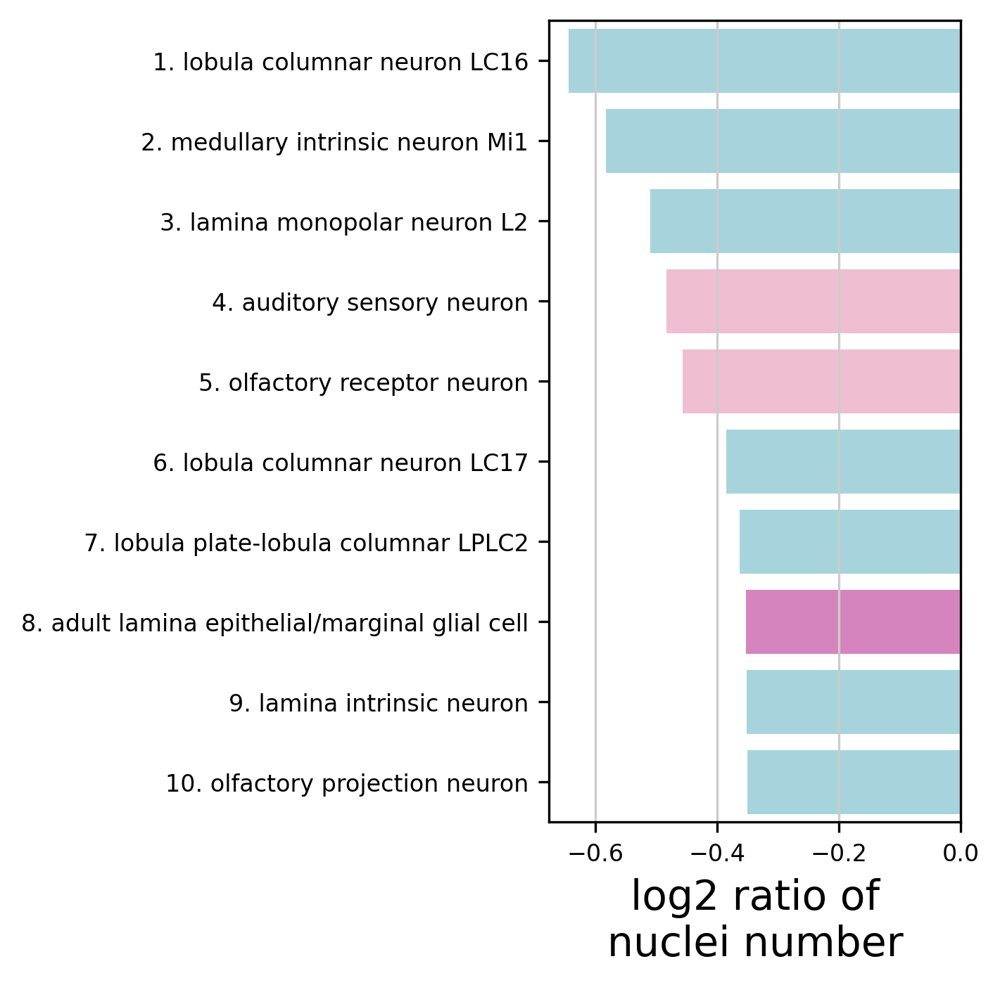

In [105]:
fig, ax = plt.subplots(figsize=(2.5, 5))
# sns.barplot(x='log2ratio', y='annotationWithN',  data=normalRatio_longDf_ab, palette=sns.color_palette("tab10")[1:2], ax=ax, width=0.8,
#             order=normalRatio_longDf_ab.annotationWithN.to_list()) #  # (olfNormalRatio_longDf.genotypeCompare == 'AB42/control_inAB42_ratio') & # hue='annotation_broad',
sns.barplot(x='log2ratio', y='annotationWithN',  data=normalRatio_longDf_ab, palette=[broadColor1_D[annot2broad_D[annot]] for annot in normalRatio_longDf_ab.annotation], 
            ax=ax, width=0.8, order=normalRatio_longDf_ab.annotationWithN.to_list())
plt.legend(bbox_to_anchor=(1.0, 1.0),)
# plt.xlim(0, 1)
plt.xlabel('log2 ratio of\nnuclei number')
plt.ylabel('')
ax.get_legend().remove()
plt.savefig(f'{figure2PicFolder}/barplot_cellRatio_bottom10_broadColors.pdf', bbox_inches='tight')

plt.show()

In [106]:
# value: category
value_to_int = dict(zip(normalRatio_longDf_ab.function.value_counts().index.to_list(), range(3)))
n = len(value_to_int) 
n

3

In [107]:
value_to_int

{'vision': 0, 'olfactory': 1, 'auditory': 2}

In [108]:
df=pd.DataFrame(index=normalRatio_longDf_ab.annotation.to_list())
df.loc[:,'value'] = [value_to_int[annot] for annot in normalRatio_longDf_ab.function]
df

,value
lobula columnar neuron LC16,0
medullary intrinsic neuron Mi1,0
lamina monopolar neuron L2,0
auditory sensory neuron,2
olfactory receptor neuron,1
lobula columnar neuron LC17,0
lobula plate-lobula columnar LPLC2,0
adult lamina epithelial/marginal glial cell,0
lamina intrinsic neuron,0
olfactory projection neuron,1


In [109]:
sns.color_palette("Set2", 9)

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254),
 (0.4, 0.7607843137254902, 0.6470588235294118)]

In [110]:
# cmap=sns.color_palette("Set3", 8) # Pastel2
cmap=sns.color_palette("Accent", 9) # Pastel2
cmap

[(0.4980392156862745, 0.788235294117647, 0.4980392156862745),
 (0.7450980392156863, 0.6823529411764706, 0.8313725490196079),
 (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
 (1.0, 1.0, 0.6),
 (0.2196078431372549, 0.4235294117647059, 0.6901960784313725),
 (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 (0.4, 0.4, 0.4),
 (0.4980392156862745, 0.788235294117647, 0.4980392156862745)]

In [111]:
cmap_L = list(cmap)[0:3]
# cmap_L = list(cmap)[0:1] + list(cmap)[4:6]

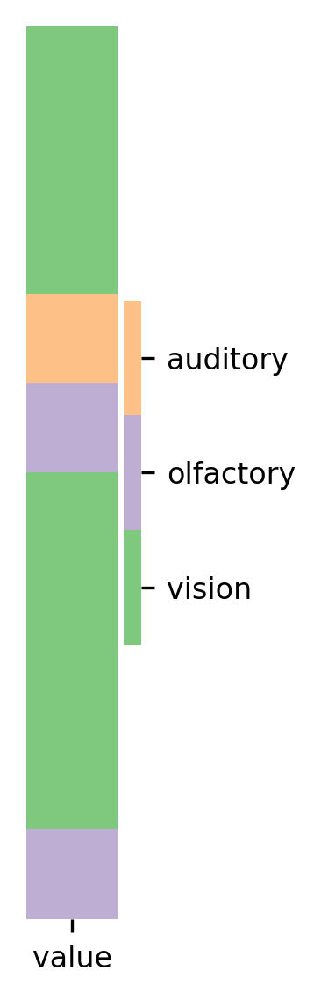

In [112]:
# plt.figure(figsize=(1, 7))
fig, ax = plt.subplots(figsize=(1.2, 4))
parameters = {'xtick.labelsize': 8,'ytick.labelsize': 8, 'legend.fontsize':8}
plt.rcParams.update(parameters)

# ax=sns.heatmap(df, cmap='Set3', xticklabels=True)
# ax=sns.heatmap(df, cmap= cmap[:1]+cmap[2:], xticklabels=True, yticklabels=False) # cmap[:8]
ax=sns.heatmap(df, xticklabels=True, yticklabels=False, cmap= cmap_L) # cmap[:8] # cmap= cmap_L, 
plt.tight_layout()

colorbar=ax.collections[0].colorbar
r = colorbar.vmax - colorbar.vmin
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(value_to_int.keys()) #not in the right order # sorted(list(value_to_int.keys()))

plt.savefig(f'{figure2PicFolder}/barplot_cellRatio_bottom10_function.pdf', bbox_inches='tight')
plt.show()

# Finished